In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy.interpolate import griddata
from mpl_toolkits.mplot3d import Axes3D


In [65]:
df=pd.read_excel('D:/CASApre/CASA11ABM/Coursework 1/vis/pop-endowment.xlsx')
df1=pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/1.csv')

In [59]:
exp12 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 2-change exp1-2-stats.csv')
exp13 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 3-change exp1-3-stats.csv')
exp22 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 2-change exp2-2-stats.csv')
exp23 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 3-change exp2-3-stats.csv')
exp32 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 2-change exp3-2-stats.csv')
exp33 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 3-change exp3-3-stats.csv')
exp4 = pd.read_csv('D:/CASApre/CASA11ABM/Coursework 1/vis/Sugarscape 3-change exp3-3-new-stats.csv')

1 exp1

1. initial-population model 2

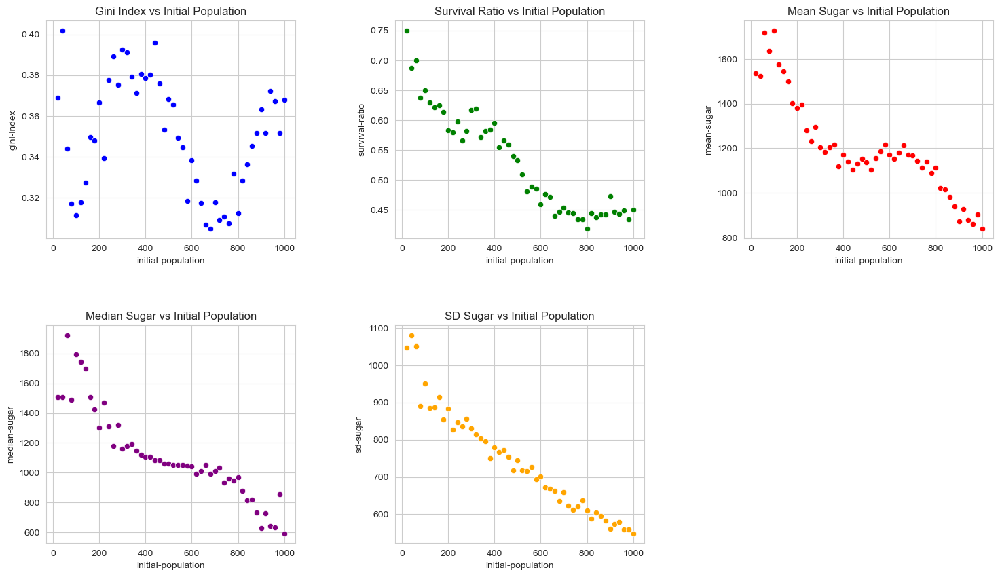

In [4]:
# Set the style of seaborn
sns.set_style("whitegrid")

# Create a figure to plot multiple subplots
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust space between plots

# Plot each dependent variable against the independent variable
sns.scatterplot(ax=axs[0, 0], data=exp12, x='initial-population', y='gini-index', color='blue')
axs[0, 0].set_title('Gini Index vs Initial Population')

sns.scatterplot(ax=axs[0, 1], data=exp12, x='initial-population', y='survival-ratio', color='green')
axs[0, 1].set_title('Survival Ratio vs Initial Population')

sns.scatterplot(ax=axs[0, 2], data=exp12, x='initial-population', y='mean-sugar', color='red')
axs[0, 2].set_title('Mean Sugar vs Initial Population')

sns.scatterplot(ax=axs[1, 0], data=exp12, x='initial-population', y='median-sugar', color='purple')
axs[1, 0].set_title('Median Sugar vs Initial Population')

sns.scatterplot(ax=axs[1, 1], data=exp12, x='initial-population', y='sd-sugar', color='orange')
axs[1, 1].set_title('SD Sugar vs Initial Population')

# Hide the empty subplot (bottom right)
axs[1, 2].set_visible(False)

plt.show()


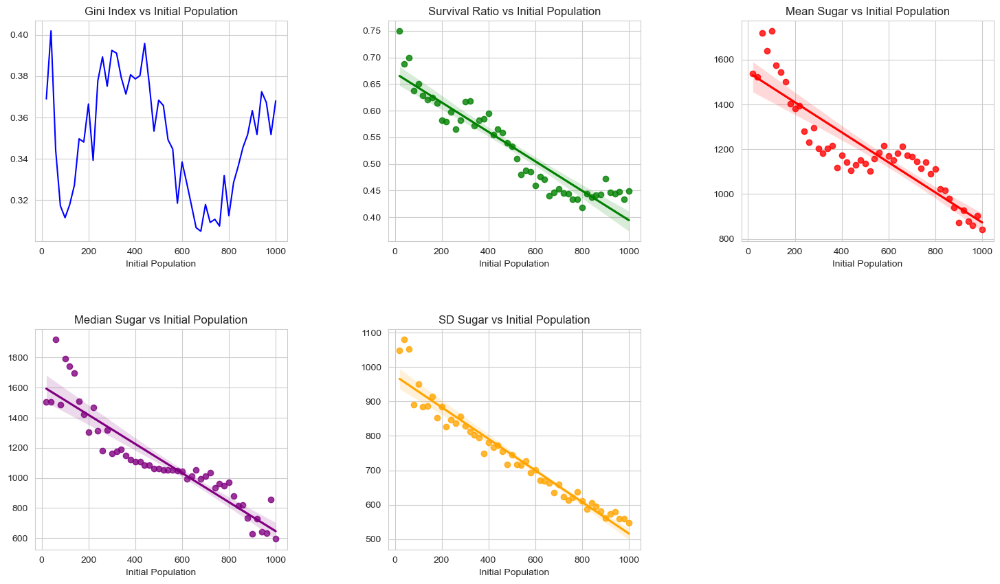

In [27]:
# Set the style of seaborn
sns.set_style("whitegrid")

# Create a figure to plot multiple subplots
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust space between plots

# Plot each dependent variable against the independent variable
sns.lineplot(ax=axs[0, 0], data=exp12.sort_values(by='initial-population'), x='initial-population', y='gini-index', color='blue')
axs[0, 0].set_title('Gini Index vs Initial Population')

sns.regplot(ax=axs[0, 1], data=exp12, x='initial-population', y='survival-ratio', color='green')
axs[0, 1].set_title('Survival Ratio vs Initial Population')

sns.regplot(ax=axs[0, 2], data=exp12, x='initial-population', y='mean-sugar', color='red')
axs[0, 2].set_title('Mean Sugar vs Initial Population')

sns.regplot(ax=axs[1, 0], data=exp12, x='initial-population', y='median-sugar', color='purple')
axs[1, 0].set_title('Median Sugar vs Initial Population')

sns.regplot(ax=axs[1, 1], data=exp12, x='initial-population', y='sd-sugar', color='orange')
axs[1, 1].set_title('SD Sugar vs Initial Population')

# Hide the empty subplot (bottom right)
axs[1, 2].set_visible(False)

# Add x and y labels to all subplots
for ax in axs.flat:
    ax.set_xlabel('Initial Population')
    ax.set_ylabel('')



plt.show()

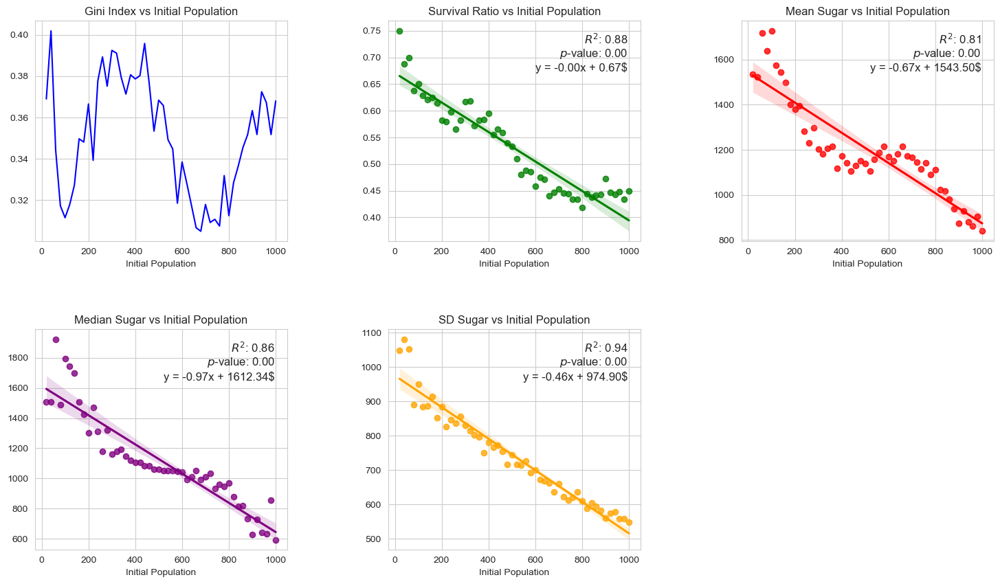

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress

# Set the style of seaborn
sns.set_style("whitegrid")

# Create a figure to plot multiple subplots
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust space between plots

# Define a function to calculate R-squared value
def r_squared(x, y):
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    return r_value**2

# Plot each dependent variable against the independent variable
for i, (x_col, y_col, color, title) in enumerate(zip(
    ['initial-population', 'initial-population', 'initial-population', 'initial-population', 'initial-population'], 
    ['gini-index', 'survival-ratio', 'mean-sugar', 'median-sugar', 'sd-sugar'], 
    ['blue', 'green', 'red', 'purple', 'orange'], 
    ['Gini Index', 'Survival Ratio', 'Mean Sugar', 'Median Sugar', 'SD Sugar']
)):
    ax = axs.flatten()[i]
    if i == 0:
        sns.lineplot(ax=ax, data=exp12.sort_values(by=x_col), x=x_col, y=y_col, color=color)
    else:
        sns.regplot(ax=ax, data=exp12, x=x_col, y=y_col, color=color)
        
        # Calculate the regression line
        slope, intercept, r_value, p_value, std_err = linregress(exp12[x_col], exp12[y_col])
        line = f'y = {slope:.2f}x + {intercept:.2f}'

        # Annotate the plot with R-squared value, p-value, and the fitted equation
        ax.annotate(f'$R^2$: {r_value**2:.2f}\n$p$-value: {p_value:.2f}\n{line}$', 
                    xy=(0.95, 0.95), 
                    xycoords='axes fraction', 
                    fontsize=12, 
                    ha='right', 
                    va='top')

    ax.set_title(f'{title} vs Initial Population')
    
    # Add x and y labels
    ax.set_xlabel('Initial Population')
    ax.set_ylabel('')

# Hide the empty subplot (bottom right)
axs[1, 2].set_visible(False)

plt.show()


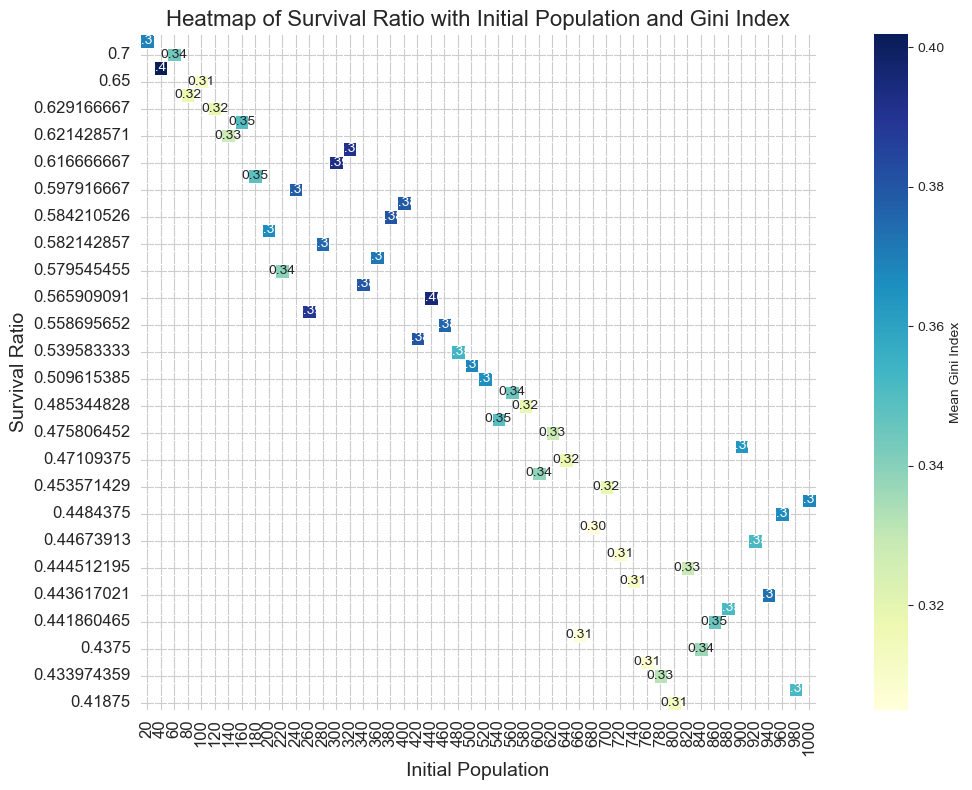

In [39]:
# Calculate the mean survival ratio for each combination of initial-population and gini-index
data_grouped = exp12.groupby(['initial-population','survival-ratio']).agg({'gini-index':'mean'}).reset_index()

# Create a pivot table for the heatmap
pivot_table = data_grouped.pivot("survival-ratio", "initial-population", "gini-index")

# Create the heatmap with styling
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Mean Gini Index'}, 
            linewidths=0.5, linecolor='white', square=True)  
plt.title('Heatmap of Survival Ratio with Initial Population and Gini Index', fontsize=16)  # 标题字体大小
plt.xlabel('Initial Population', fontsize=14)  
plt.ylabel('Survival Ratio', fontsize=14)  
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  
plt.gca().invert_yaxis()  
plt.tight_layout() 
plt.show()


2. initial-population model 3

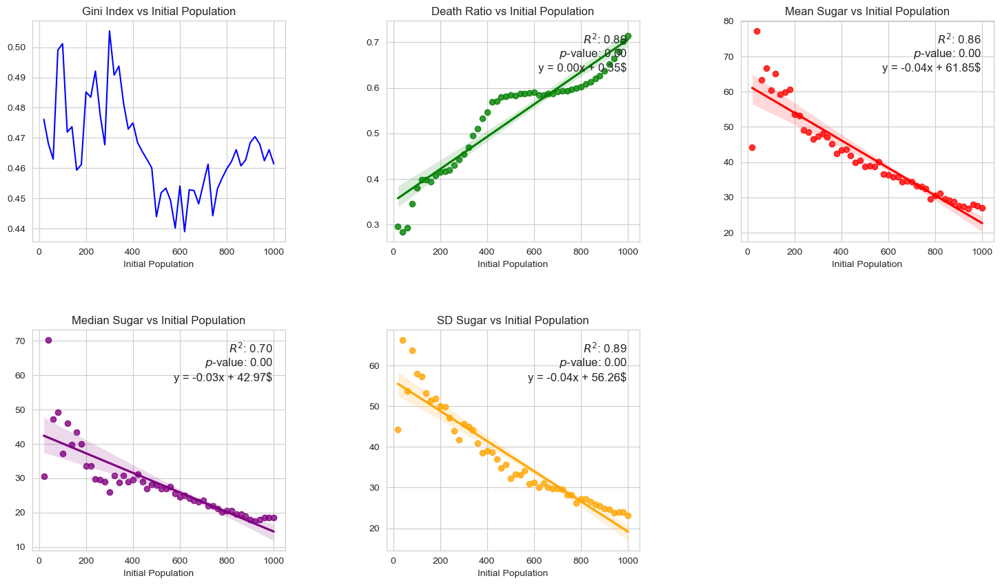

In [38]:
# Set the style of seaborn
sns.set_style("whitegrid")

# Create a figure to plot multiple subplots
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust space between plots

# Define a function to calculate R-squared value
def r_squared(x, y):
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    return r_value**2

# Plot each dependent variable against the independent variable
for i, (x_col, y_col, color, title) in enumerate(zip(
    ['initial-population', 'initial-population', 'initial-population', 'initial-population', 'initial-population'], 
    ['gini-index', 'death-ratio', 'mean-sugar', 'median-sugar', 'sd-sugar'], 
    ['blue', 'green', 'red', 'purple', 'orange'], 
    ['Gini Index', 'Death Ratio', 'Mean Sugar', 'Median Sugar', 'SD Sugar']
)):
    ax = axs.flatten()[i]
    if i == 0:
        sns.lineplot(ax=ax, data=exp13.sort_values(by=x_col), x=x_col, y=y_col, color=color)
    else:
        sns.regplot(ax=ax, data=exp13, x=x_col, y=y_col, color=color)
        
        # Calculate the regression line
        slope, intercept, r_value, p_value, std_err = linregress(exp13[x_col], exp13[y_col])
        line = f'y = {slope:.2f}x + {intercept:.2f}'

        # Annotate the plot with R-squared value, p-value, and the fitted equation
        ax.annotate(f'$R^2$: {r_value**2:.2f}\n$p$-value: {p_value:.2f}\n{line}$', 
                    xy=(0.95, 0.95), 
                    xycoords='axes fraction', 
                    fontsize=12, 
                    ha='right', 
                    va='top')

    ax.set_title(f'{title} vs Initial Population')
    
    # Add x and y labels
    ax.set_xlabel('Initial Population')
    ax.set_ylabel('')

# Hide the empty subplot (bottom right)
axs[1, 2].set_visible(False)

plt.show()



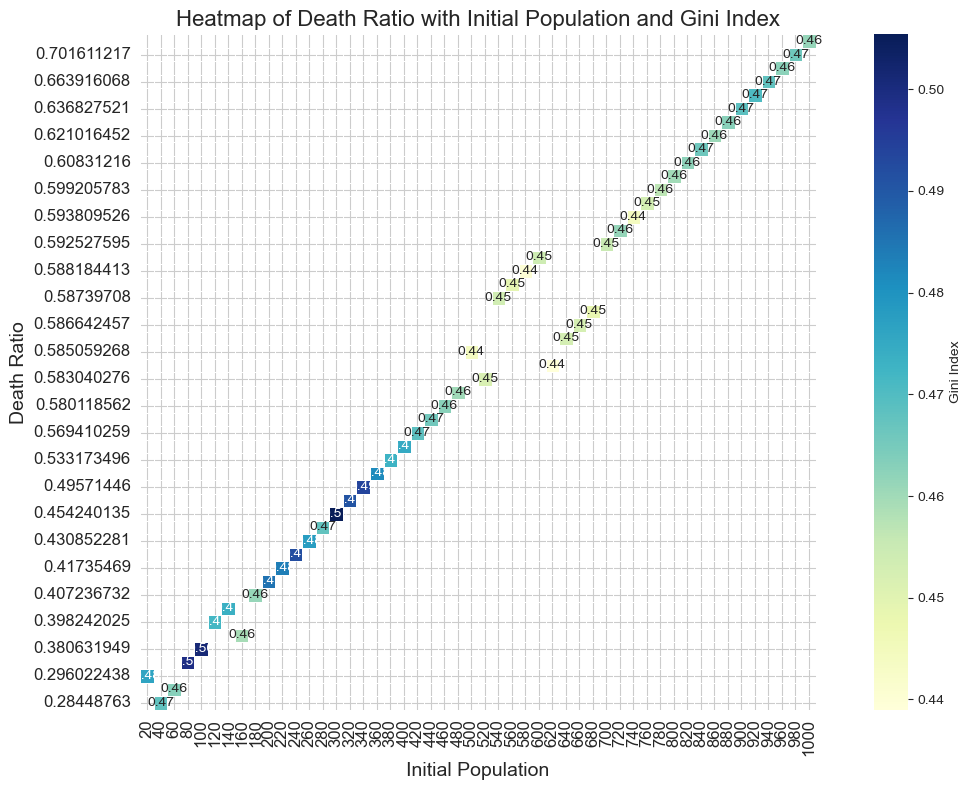

In [40]:
# Calculate the mean survival ratio for each combination of initial-population and gini-index
data_grouped13 = exp13.groupby(['initial-population','death-ratio']).agg({'gini-index':'mean'}).reset_index()

# Create a pivot table for the heatmap
pivot_table13 = data_grouped13.pivot( "death-ratio","initial-population", "gini-index")

# Create the heatmap with styling
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table13, cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Gini Index'}, 
            linewidths=0.5, linecolor='white', square=True)  
plt.title('Heatmap of Death Ratio with Initial Population and Gini Index', fontsize=16)  # 标题字体大小
plt.xlabel('Initial Population', fontsize=14)  
plt.ylabel('Death Ratio', fontsize=14)  
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  
plt.gca().invert_yaxis()  
plt.tight_layout() 
plt.show()

2 exp2

2.1 endowment model 2

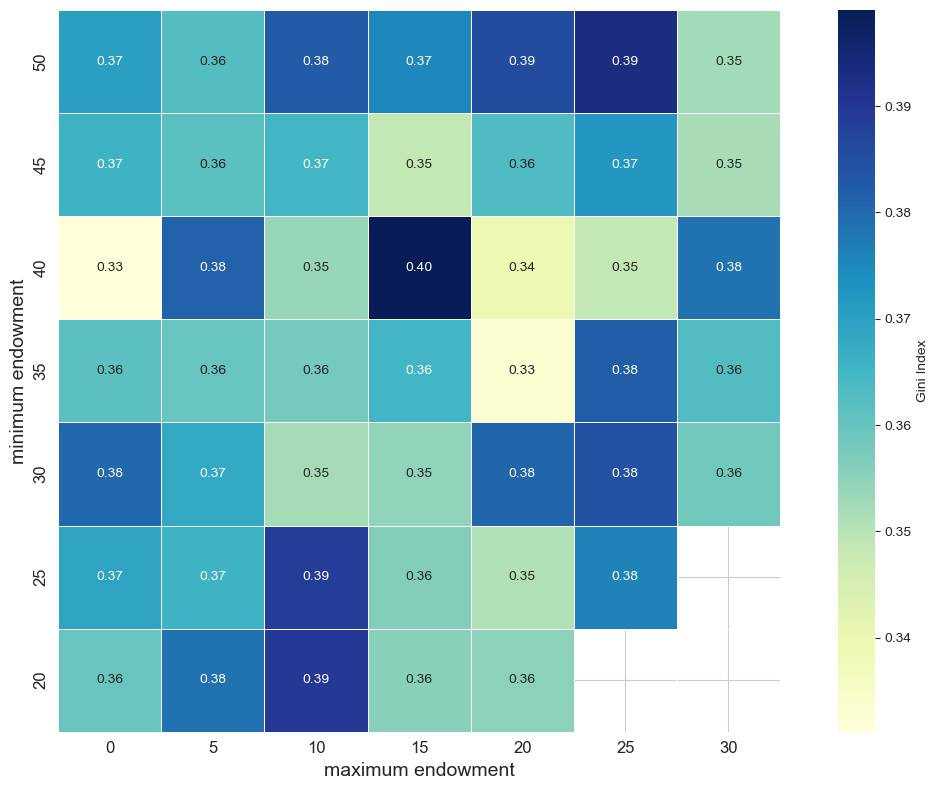

In [80]:
# Calculate the mean survival ratio for each combination of initial-population and gini-index
data_grouped22 = exp22.groupby(['maximum-sugar-endowment','minimum-sugar-endowment']).agg({'gini-index':'mean'}).reset_index()

# Create a pivot table for the heatmap
pivot_table22 = data_grouped22.pivot("maximum-sugar-endowment", "minimum-sugar-endowment", "gini-index")

# Create the heatmap with styling
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table22, cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Gini Index'}, 
            linewidths=0.5, linecolor='white', square=True)  

plt.xlabel('maximum endowment', fontsize=14)  
plt.ylabel('minimum endowment', fontsize=14)  
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  
plt.gca().invert_yaxis()  
plt.tight_layout() 
plt.show()

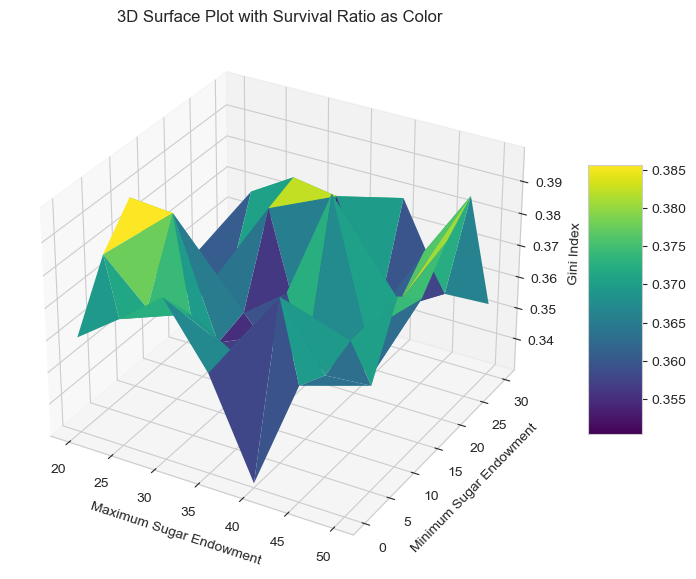

In [8]:
# Prepare data
x = exp22['maximum-sugar-endowment']
y = exp22['minimum-sugar-endowment']
z = exp22['gini-index']
c = exp22['survival-ratio']

# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Use a colormap to color the surface. The `cmap` parameter allows choosing the color map.
# The `stride` parameter specifies the step size for how densely the surface plot samples the data points.
surf = ax.plot_trisurf(x, y, z, cmap='viridis', edgecolor='none', linewidth=0.2, antialiased=True)
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5) # Add a color bar which maps values to colors.

# Customize labels
ax.set_xlabel('Maximum Sugar Endowment')
ax.set_ylabel('Minimum Sugar Endowment')
ax.set_zlabel('Gini Index')
ax.set_title('3D Surface Plot with Survival Ratio as Color')

# Show plot
plt.show()


In [43]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming X, Y, Z, and AI are your existing data
X = exp22['maximum-sugar-endowment']
Y = exp22['minimum-sugar-endowment']
Z = exp22['gini-index']
AI = exp22['survival-ratio']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Gini Index',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()


2.2 endowment model 3

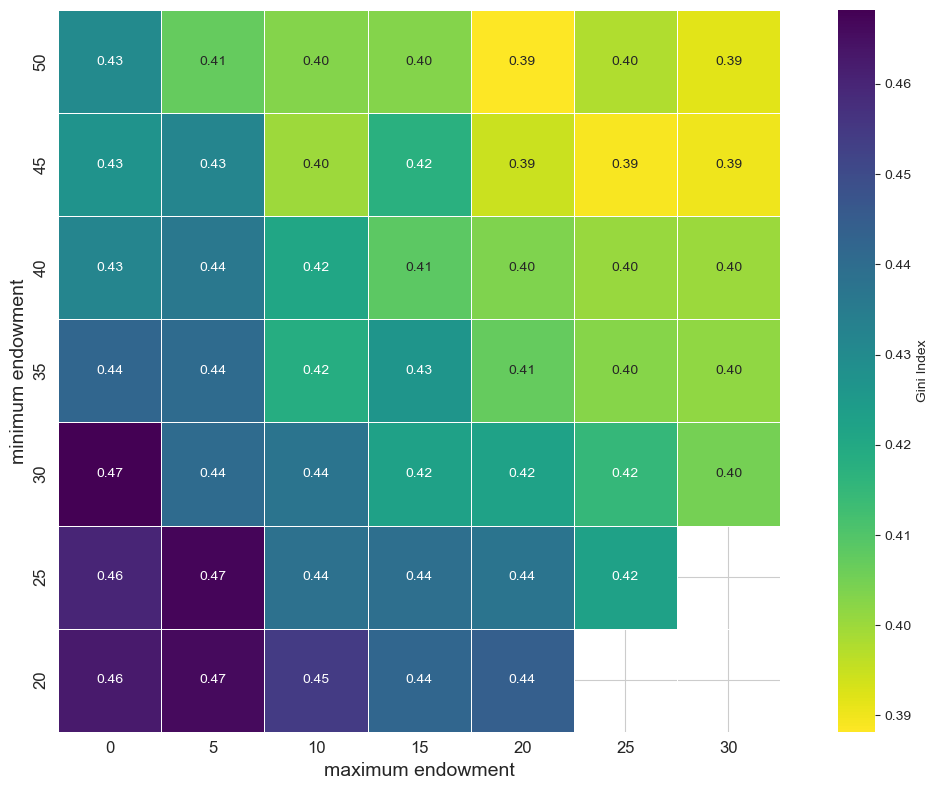

In [76]:
# Calculate the mean survival ratio for each combination of initial-population and gini-index
data_grouped23 = exp23.groupby(['maximum-sugar-endowment','minimum-sugar-endowment']).agg({'gini-index':'mean'}).reset_index()

# Create a pivot table for the heatmap
pivot_table23 = data_grouped23.pivot("maximum-sugar-endowment", "minimum-sugar-endowment", "gini-index")

# Create the heatmap with styling
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table23, annot=True, fmt=".2f", cbar_kws={'label': 'Gini Index'}, 
            linewidths=0.5, linecolor='white', square=True, cmap='viridis_r')  

plt.xlabel('maximum endowment', fontsize=14)  
plt.ylabel('minimum endowment', fontsize=14)  
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  
plt.gca().invert_yaxis()  
plt.tight_layout() 
plt.show()

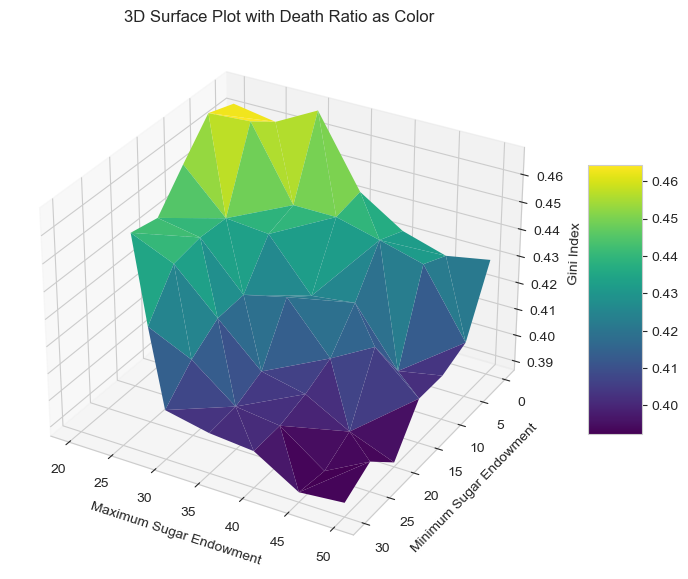

In [10]:
# Prepare data
x = exp23['maximum-sugar-endowment']
y = exp23['minimum-sugar-endowment']
z = exp23['gini-index']
c = exp23['death-ratio']

# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Use a colormap to color the surface. The `cmap` parameter allows choosing the color map.
# The `stride` parameter specifies the step size for how densely the surface plot samples the data points.
surf = ax.plot_trisurf(x, y, z, cmap='viridis', edgecolor='none', linewidth=0.2, antialiased=True)
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5) # Add a color bar which maps values to colors.

# Customize labels
ax.set_xlabel('Maximum Sugar Endowment')

ax.set_ylabel('Minimum Sugar Endowment')
ax.invert_yaxis()
ax.set_zlabel('Gini Index')
ax.set_title('3D Surface Plot with Death Ratio as Color')

# Show plot
plt.show()

In [44]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming X, Y, Z, and AI are your existing data
X = exp23['maximum-sugar-endowment']
Y = exp23['minimum-sugar-endowment']
Z = exp23['gini-index']
AI = exp23['death-ratio']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Gini Index',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()

3 exp3

3.1 initial-population + endowment  model 2

In [45]:
# Assuming X, Y, Z, and AI are your existing data
X = exp32['maximum-sugar-endowment']
Y = exp32['minimum-sugar-endowment']
Z = exp32['initial-population']
AI = exp32['survival-ratio']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Initial Population',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()

In [46]:
# Assuming X, Y, Z, and AI are your existing data
X = exp32['maximum-sugar-endowment']
Y = exp32['minimum-sugar-endowment']
Z = exp32['initial-population']
AI = exp32['gini-index']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Initial Population',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()

3.2 initial-population + endowment  model 3

In [60]:
# Assuming X, Y, Z, and AI are your existing data
X = exp33['maximum-sugar-endowment']
Y = exp33['minimum-sugar-endowment']
Z = exp33['initial-population']
AI = exp33['death-ratio']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Initial Population',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()

In [62]:
# Assuming X, Y, Z, and AI are your existing data
X = exp33['maximum-sugar-endowment']
Y = exp33['minimum-sugar-endowment']
Z = exp33['initial-population']
AI = exp33['gini-index']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Initial Population',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()

4. exp4

In [49]:
# Assuming X, Y, Z, and AI are your existing data
X = exp4['starve-count']
Y = exp4['age-death-count']
Z = exp4['max-min']
AI = exp4['initial-population']

# Grid the X and Y data
xi = np.linspace(X.min(), X.max(), 100)
yi = np.linspace(Y.min(), Y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the Z data
zi = griddata((X, Y), Z, (xi, yi), method='cubic')

# Interpolate the AI data to get ai_mapped, the AI values mapped onto the grid defined by xi and yi
ai_mapped = griddata((X, Y), AI, (xi, yi), method='cubic')

colorscale = 'spectral_r'

# Use the interpolated ai_mapped as color mapping
fig = go.Figure(data=[go.Surface(z=zi, x=xi, y=yi, surfacecolor=ai_mapped, colorscale=colorscale)],
                layout=go.Layout(
                    autosize=False,
                    width=1250, height=800,
                    margin=dict(l=30, r=30, b=70, t=40)
                ))

fig.update_layout(scene=dict(
                    xaxis=dict(autorange='reversed', title='Maximum Sugar Endowment'),
                    yaxis_title='Minimum Sugar Endowment',
                    zaxis_title='Initial Population',
                    aspectratio=dict(x=1, y=1, z=0.7),
                    aspectmode='manual',
                    bgcolor='rgb(255, 255, 255)',
                    ))

fig.show()

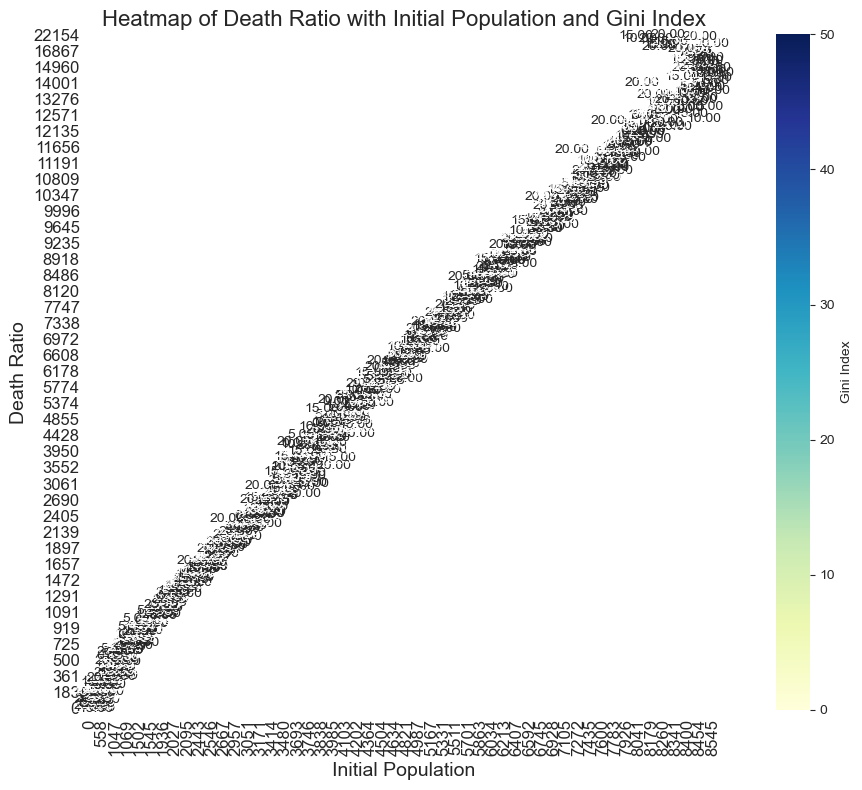

In [50]:
# Calculate the mean survival ratio for each combination of initial-population and gini-index
data_grouped4 = exp4.groupby(['starve-count','age-death-count']).agg({'max-min':'mean'}).reset_index()

# Create a pivot table for the heatmap
pivot_table4 = data_grouped4.pivot( "starve-count","age-death-count", "max-min")

# Create the heatmap with styling
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table4, cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Gini Index'}, 
            linewidths=0.5, linecolor='white', square=True)  
plt.title('Heatmap of Death Ratio with Initial Population and Gini Index', fontsize=16)  # 标题字体大小
plt.xlabel('Initial Population', fontsize=14)  
plt.ylabel('Death Ratio', fontsize=14)  
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  
plt.gca().invert_yaxis()  
plt.tight_layout() 
plt.show()

In [53]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Preparing the data for regression models
X = exp4[['max-min', 'initial-population']] # Independent variables
y_starve_count = exp4['starve-count'] # Dependent variable for the first model
y_age_death_count = exp4['age-death-count'] # Dependent variable for the second model

# Creating and fitting the linear regression model for starve-count
model_starve_count = LinearRegression()
model_starve_count.fit(X, y_starve_count)

# Creating and fitting the linear regression model for age-death-count
model_age_death_count = LinearRegression()
model_age_death_count.fit(X, y_age_death_count)

# Getting coefficients for both models
coefficients_starve_count = model_starve_count.coef_
coefficients_age_death_count = model_age_death_count.coef_

coefficients_starve_count, coefficients_age_death_count, model_starve_count.intercept_, model_age_death_count.intercept_


(array([ 6.39173205, 16.05894772]),
 array([-0.46325725,  8.51239134]),
 -1962.2524469933714,
 294.08475836584785)

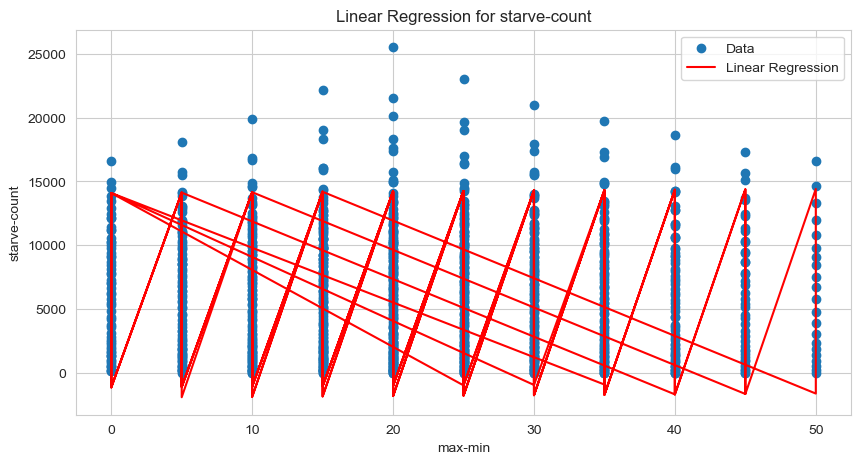

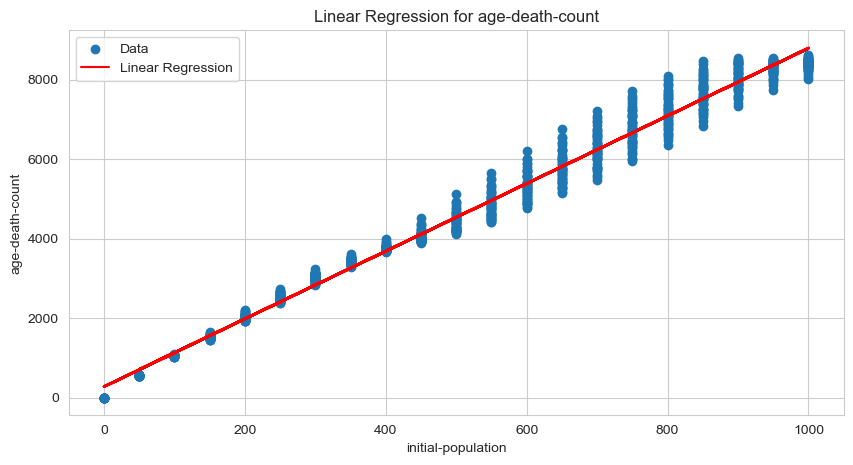

In [55]:
import matplotlib.pyplot as plt

# Scatter plot for starve-count model
plt.figure(figsize=(10, 5))
plt.scatter(X['max-min'], y_starve_count, label='Data')
plt.plot(X['max-min'], model_starve_count.predict(X), color='red', label='Linear Regression')
plt.xlabel('max-min')
plt.ylabel('starve-count')
plt.title('Linear Regression for starve-count')
plt.legend()
plt.show()

# Scatter plot for age-death-count model
plt.figure(figsize=(10, 5))
plt.scatter(X['initial-population'], y_age_death_count, label='Data')
plt.plot(X['initial-population'], model_age_death_count.predict(X), color='red', label='Linear Regression')
plt.xlabel('initial-population')
plt.ylabel('age-death-count')
plt.title('Linear Regression for age-death-count')
plt.legend()
plt.show()

